## Github Setup
If not already present this clones the repo into google colab so that I may work on it with a bash environment.

In [0]:
!git config --global user.name "Richard Boyne"
!git config --global user.email "boynerichard@yahoo.co.uk"

In [3]:
from getpass import getpass
import os

if not os.path.isdir(".git"):
    user = "Boyne272"
    password = getpass('github password')
    os.environ['GITHUB_AUTH'] = user + ':' + password

    # clone the repo
    !git clone https://$GITHUB_AUTH@github.com/msc-acse/acse-9-independent-research-project-Boyne272.git repo

    # move the repo up one
    !mv repo/.git .
    !git checkout kmeans
    !git reset --hard
    
if os.path.isdir("sample_data"):
    !rm -r sample_data/
    
if os.path.isdir("repo"):    
    !rm -r repo
    
!ls -la

github password··········
Cloning into 'repo'...
remote: Enumerating objects: 83, done.
remote: Counting objects: 100% (83/83), done.
remote: Compressing objects: 100% (60/60), done.
remote: Total 83 (delta 37), reused 51 (delta 18), pack-reused 0
Unpacking objects: 100% (83/83), done.
D	.gitignore
D	Peliminary Report Richard Boyne.pdf
D	README.md
D	Thin_Sections_Workspace.ipynb
D	images/TX1_polarised_cropped.tif
D	images/TX1_white_cropped.tif
D	kmeans/kmeans_basic.py
D	kmeans/kmeans_examples.ipynb
D	kmeans/kmeans_img.py
D	kmeans/kmeans_local.py
D	kmeans/kmeans_local_failed.py
D	kmeans/test_kmeans_basic.py
D	kmeans/test_kmeans_img.py
D	kmeans/test_kmeans_local.py
D	kmeans/test_kmeans_local_failed.py
D	kmeans/tools.py
Branch 'kmeans' set up to track remote branch 'kmeans' from 'origin'.
Switched to a new branch 'kmeans'
HEAD is now at 3d6c0c5 Created SLIC and MSLIC
total 8424
drwxr-xr-x 1 root root    4096 Jul 12 15:20  .
drwxr-xr-x 1 root root    4096 Jul 12 15:14  ..
drwxr-xr-x 1 root

In [0]:
!mv tmp.txt kmeans/MSLIC.py

In [0]:
!git add kmeans/MSLIC.py

In [42]:
!git status

On branch kmeans
Your branch is up to date with 'origin/kmeans'.

Changes to be committed:
  (use "git reset HEAD <file>..." to unstage)

	new file:   images/MSLIC_comparisons/MSLIC_both_1600k_10i.jpg
	new file:   images/MSLIC_comparisons/MSLIC_polar_1600k_10i.jpg
	new file:   images/MSLIC_comparisons/MSLIC_white_1600k_10i.jpg
	new file:   images/MSLIC_comparisons/SLIC_polar_1600k_10i.jpg
	new file:   images/MSLIC_comparisons/SLIC_white_1600k_10i.jpg
	modified:   kmeans/MSLIC.py



In [43]:
!git commit -m

False

## Imports
Some python magic functions for convenience and some basic packages that are often used 

In [6]:
# Ipython magic functions
%load_ext autoreload
%autoreload 2
%matplotlib inline

# add paths to look for local modules
import sys
sys.path.insert(0, "/content/kmeans")

# imports
import torch
import matplotlib.pyplot as plt
import numpy as np
import scipy.signal as sig
from tools import set_seed, get_img, progress_bar

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## First simple 2d kmeans

Progress |##############################################    |

[Text(0.5, 1.0, '10 iterations')]

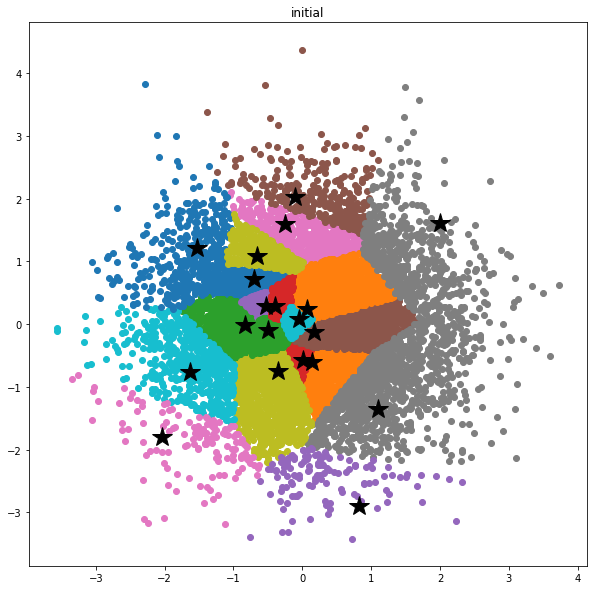

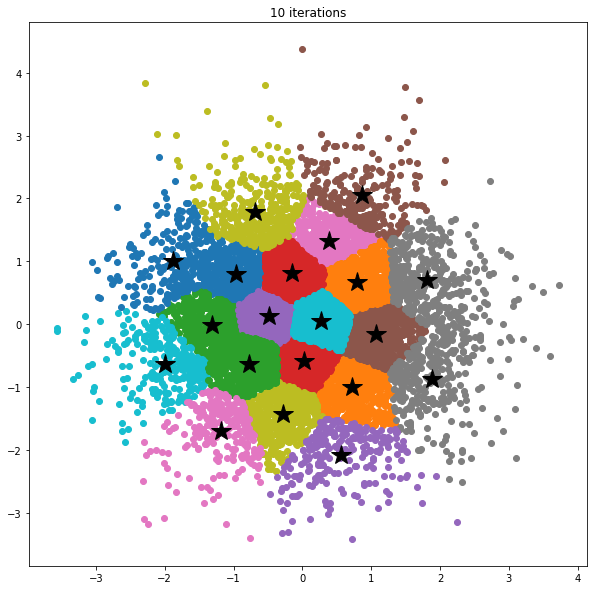

In [7]:
from kmeans_basic import kmeans

# generate random 2d data
N = 10000
x = torch.randn(N, 2, dtype=torch.float64)

# create the kmeans object
obj = kmeans(x, 20)
obj.update_clusters()
obj.plot().set(title='initial')

obj.iterate(10)
obj.plot().set(title="10 iterations")


## Image kmeans with no locality restriction

Progress |##############################################    |  103.684681 s


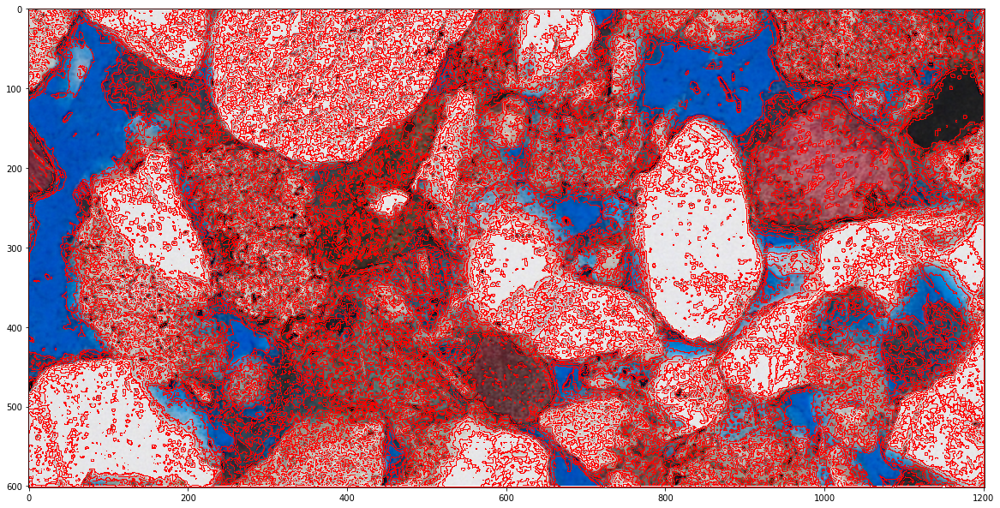

In [8]:
def scaled_dist_metric(cent, vecs, factor=1/(600*1200)):
    color    = (cent[2:]-vecs[:, 2:]).norm(dim=1)
    position = (cent[:2]-vecs[:, :2]).norm(dim=1)
    return color + factor*position

from kmeans_img import kmeans_img 
set_seed(10)

img = get_img("images/TX1_white_cropped.tif")
obj = kmeans_img(img, 20, dist_func=scaled_dist_metric)
obj.iterate(10)

mask = obj.get_mask(edge=True, rgba=True)
fig, ax = plt.subplots(figsize=[20, 20])
ax.imshow(img)
ax.imshow(mask)
    

## Image Kmeans with locality restriction by binning 

Progress |###################################################| 52.2905 s

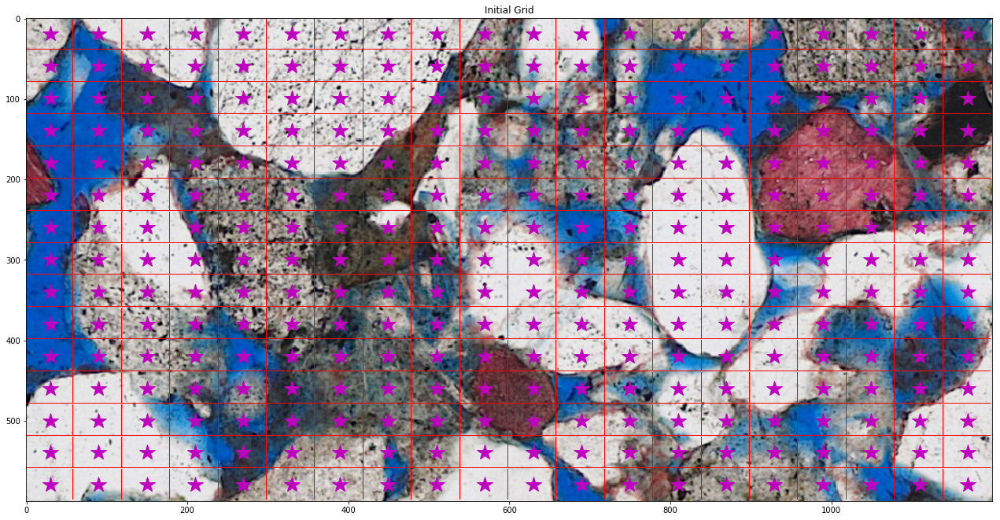

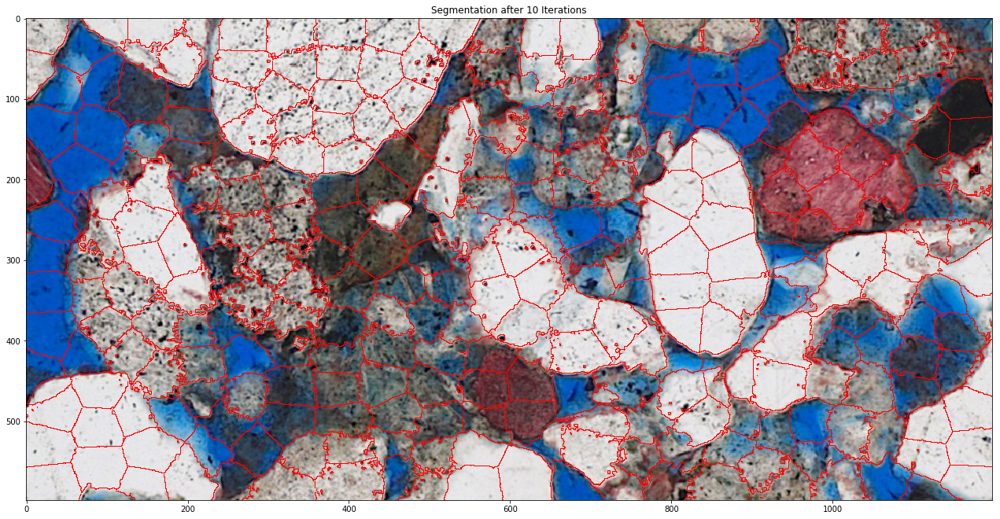

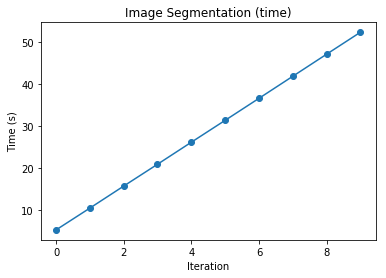

In [9]:
from kmeans_local import kmeans_local

# setup
set_seed(10)
img = get_img("images/TX1_white_cropped.tif")
obj = kmeans_local(img, [20,15])

# plot the initial binning 
fig, ax = plt.subplots(figsize=[22,22])
obj.plot("bins", ax=ax)
obj.plot("centers", ax=ax)
ax.set(title='Initial Grid')

# iterate
obj.iterate(10)

# plot the resulting segmentation
fig, ax = plt.subplots(figsize=[22, 22])
obj.plot('default', ax=ax)
ax.set(title='Segmentation after 10 Iterations')

# plot the time taken
obj.plot('time')

## MSLIC implenetation using both polarised and white light
Comparison with SLIC (same as kmeans local above)

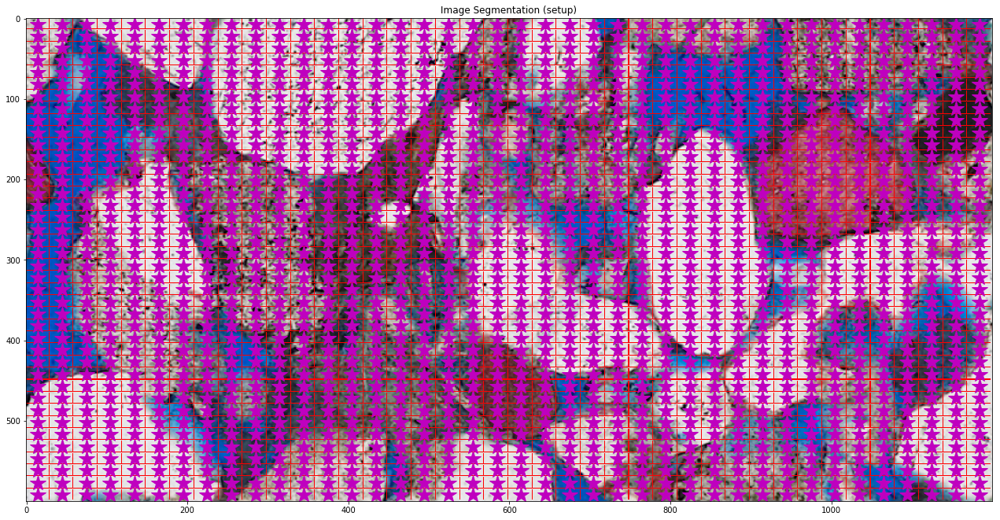

In [17]:
from SLIC import SLIC
from MSLIC import MSLIC_wrapper

# setup
bin_grid = [80, 80]
img_white = get_img("images/TX1_white_cropped.tif")
img_polar = get_img("images/TX1_polarised_cropped.tif")

# make each solver
SLIC_white = SLIC(img_white, bin_grid)
SLIC_polar = SLIC(img_polar, bin_grid)
multi_SLIC = MSLIC_wrapper([img_white, img_polar], bin_grid)

# plot the initial state
multi_SLIC.plot([0], 'setup')

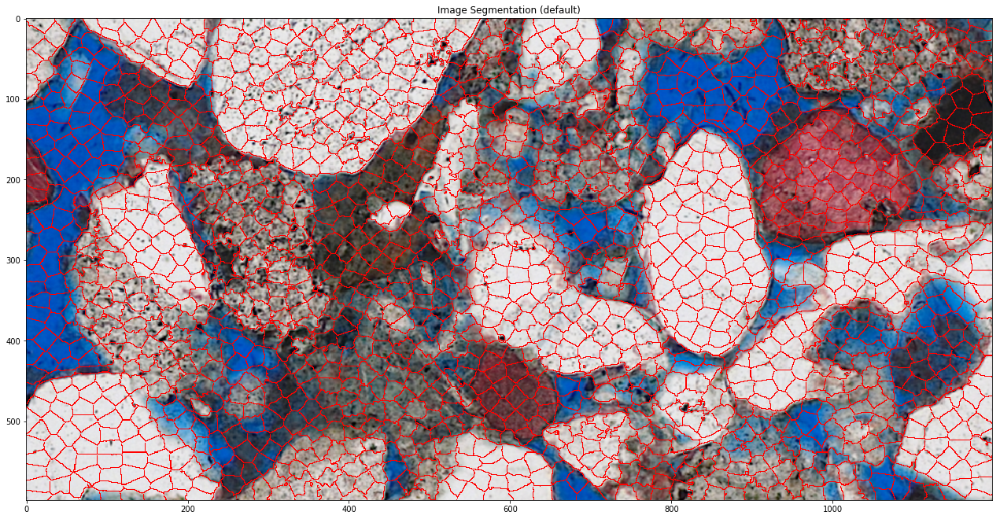

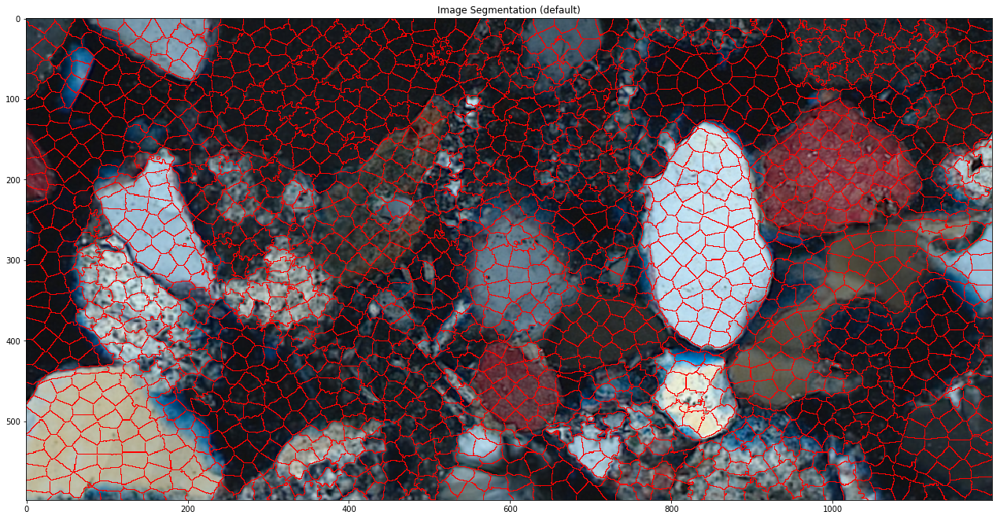

In [36]:
multi_SLIC.iterate(10)

multi_SLIC.plot([0,1], option='default')
plt.savefig('images/MSLIC_comparisons/MSLIC_both_1600k_10i.jpg')

multi_SLIC.plot([0], option='default')
plt.savefig('images/MSLIC_comparisons/MSLIC_white_1600k_10i.jpg')

multi_SLIC.plot([1], option='default')
plt.savefig('images/MSLIC_comparisons/MSLIC_polar_1600k_10i.jpg')

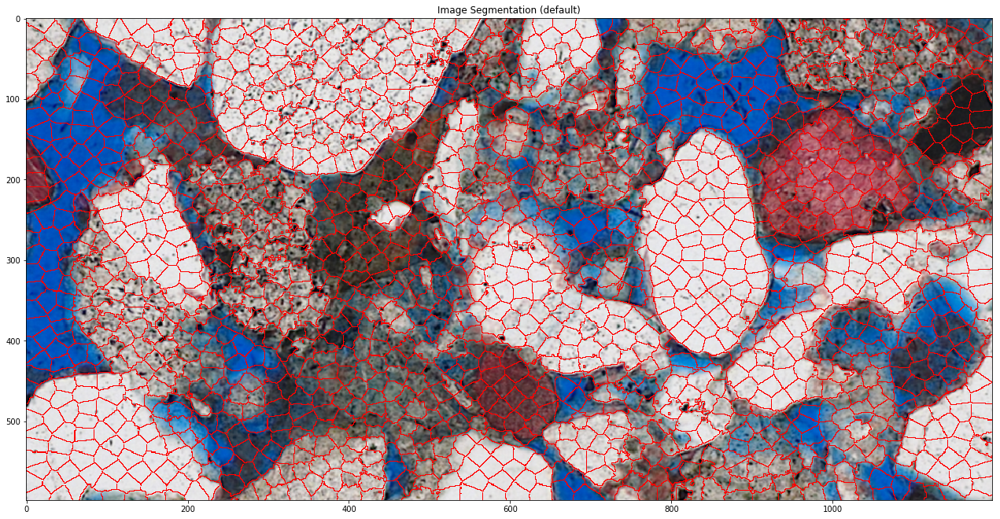

In [31]:
SLIC_white.iterate(10)
SLIC_white.plot('default', path='images/MSLIC_comparisons/SLIC_white_1600k_10i.jpg')

Progress |###################################################| 87.9536 s

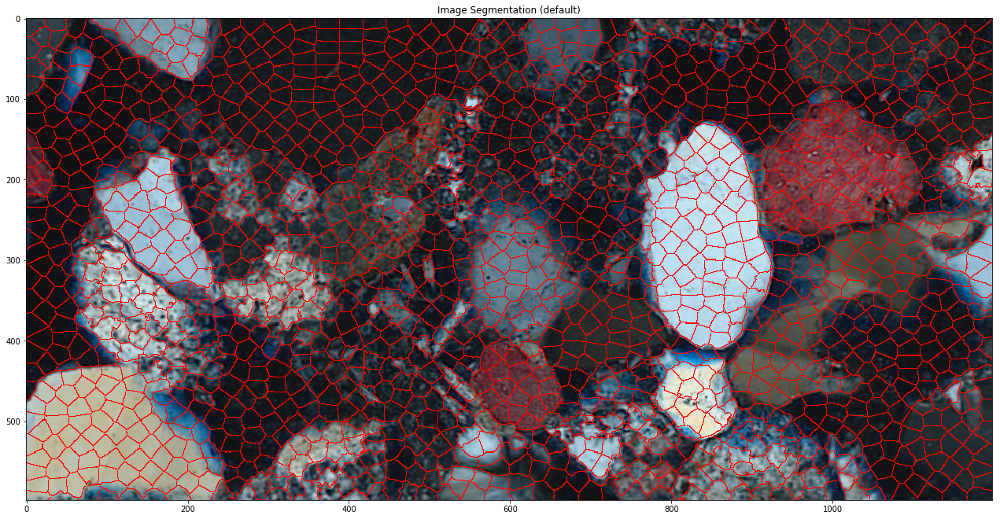

In [35]:
SLIC_polar.iterate(10)
SLIC_polar.plot('default', path='images/MSLIC_comparisons/SLIC_polar_1600k_10i.jpg')